In [1]:
import pandas as pd
import numpy as np
import os
import torch
from torchvision import transforms, models
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models import ResNet50_Weights
from PIL import Image
from torch.utils.data import DataLoader
import torch.optim as optim


In [20]:
pip install opencv-python



[notice] A new release of pip is available: 23.1.2 -> 24.3.1
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [21]:
pip install scikit-image



[notice] A new release of pip is available: 23.1.2 -> 24.3.1
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [2]:
image_dir = '/Users/sridhrutitikkisetti/Desktop/Dip Project/Remote Sensing Data.v2i.yolov8/train/images'
label_dir = '/Users/sridhrutitikkisetti/Desktop/Dip Project/Remote Sensing Data.v2i.yolov8/train/labels'

image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.jpg') or f.endswith('.png')])
label_files = sorted([f for f in os.listdir(label_dir) if f.endswith('.txt')])


In [3]:
image_paths = []
class_labels = []
center_x = []
center_y = []
width = []
height = []

for img, lbl in zip(image_files, label_files):
    img_path = os.path.join(image_dir, img)
    label_path = os.path.join(label_dir, lbl)

    with open(label_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            if len(parts) == 5:
                image_paths.append(img_path)
                class_labels.append(int(parts[0]))
                center_x.append(float(parts[1]))
                center_y.append(float(parts[2]))
                width.append(float(parts[3]))
                height.append(float(parts[4]))

df = pd.DataFrame({
    'image_path': image_paths,
    'class_label': class_labels,
    'center_x': center_x,
    'center_y': center_y,
    'width': width,
    'height': height
})


In [4]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

image_paths = list(df['image_path'])
labels = list(df['class_label'])
bboxes = []

for i in range(len(df)):
    center_x = df.iloc[i]['center_x']
    center_y = df.iloc[i]['center_y']
    width = df.iloc[i]['width']
    height = df.iloc[i]['height']

    xmin = center_x - width / 2
    xmax = center_x + width / 2
    ymin = center_y - height / 2
    ymax = center_y + height / 2
    bboxes.append([xmin, ymin, xmax, ymax])


In [5]:
from skimage import exposure

In [6]:
images = []
targets = []

for i in range(len(image_paths)):
    image = Image.open(image_paths[i]).convert("RGB")
    image = transform(image)
    images.append(image)

    target = {
        'boxes': torch.tensor([bboxes[i]], dtype=torch.float32),
        'labels': torch.tensor([labels[i]], dtype=torch.int64)
    }
    targets.append(target)

train_loader = DataLoader(
    dataset=list(zip(images, targets)),
    batch_size=4,
    shuffle=True,
    collate_fn=lambda x: tuple(zip(*x))
)


In [7]:
num_classes = len(df['class_label'].unique()) + 1  # Add 1 for the background class

model = fasterrcnn_resnet50_fpn(
    weights="DEFAULT",
    weights_backbone=ResNet50_Weights.IMAGENET1K_V1,
    trainable_backbone_layers=5
)

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [8]:
optimizer = torch.optim.SGD(
    model.parameters(),
    lr=0.002,
    momentum=0.9,
    weight_decay=0.0005
)

# Learning rate scheduler
lr_scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)


In [9]:
num_epochs = 5

model.train()
for epoch in range(num_epochs):
    running_loss = 0.0

    for images_batch, targets_batch in train_loader:
        images_batch = [img.to(device) for img in images_batch]
        targets_batch = [{k: v.to(device) for k, v in t.items()} for t in targets_batch]

        optimizer.zero_grad()

        loss_dict = model(images_batch, targets_batch)
        losses = sum(loss for loss in loss_dict.values())

        losses.backward()
        optimizer.step()

        running_loss += losses.item()

    lr_scheduler.step()
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss / len(train_loader)}")


Epoch 1/5, Loss: 0.1736376347309128
Epoch 2/5, Loss: 0.10174304085539625
Epoch 3/5, Loss: 0.09581576104470116
Epoch 4/5, Loss: 0.09082946776945323
Epoch 5/5, Loss: 0.0901622399687767


In [10]:
# Save the trained model
model_path = "faster_rcnn_trained_model.pth"
torch.save(model.state_dict(), model_path)
print(f"Model saved to {model_path}")

Model saved to faster_rcnn_trained_model.pth


In [16]:
# Define a function to compute IoU
def compute_iou(box1, box2):
    # box: [xmin, ymin, xmax, ymax]
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])

    union = area1 + area2 - intersection
    return intersection / union if union > 0 else 0

# Evaluate the model
iou_threshold = 0.5  # IoU threshold to consider a prediction as correct
correct_predictions = 0
total_predictions = 0

model.eval()
with torch.no_grad():
    for images_batch, targets_batch in train_loader:
        images_batch = [img.to(device) for img in images_batch]
        targets_batch = [{k: v.to(device) for k, v in t.items()} for t in targets_batch]

        predictions = model(images_batch)

        for i, prediction in enumerate(predictions):
            gt_boxes = targets_batch[i]['boxes'].cpu().numpy()
            pred_boxes = prediction['boxes'].cpu().numpy()
            pred_labels = prediction['labels'].cpu().numpy()

            for gt_box in gt_boxes:
                matched = False
                for j, pred_box in enumerate(pred_boxes):
                    iou = compute_iou(gt_box, pred_box)
                    if iou >= iou_threshold:
                        matched = True
                        correct_predictions += 1
                        break

                total_predictions += 1

accuracy = correct_predictions / total_predictions if total_predictions > 0 else 0
print(f"Model Accuracy: {accuracy * 100:.2f}%")


Model Accuracy: 92.78%


In [37]:
import torch
from torchvision import transforms
from PIL import Image
import os

# Load the trained model
model_path = "faster_rcnn_trained_model.pth"
model = fasterrcnn_resnet50_fpn(
    weights="DEFAULT",
    weights_backbone=ResNet50_Weights.IMAGENET1K_V1,
    trainable_backbone_layers=5
)

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()

# Test dataset directories
test_image_dir = '/Users/sridhrutitikkisetti/Desktop/Dip Project/Remote Sensing Data.v2i.yolov8/test/images'
test_label_dir = '/Users/sridhrutitikkisetti/Desktop/Dip Project/Remote Sensing Data.v2i.yolov8/test/labels'

# Test dataset preprocessing
test_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Prepare test data
test_image_files = sorted([f for f in os.listdir(test_image_dir) if f.endswith('.jpg') or f.endswith('.png')])
test_label_files = sorted([f for f in os.listdir(test_label_dir) if f.endswith('.txt')])

test_images = []
test_targets = []

for img, lbl in zip(test_image_files, test_label_files):
    img_path = os.path.join(test_image_dir, img)
    label_path = os.path.join(test_label_dir, lbl)

    # Load and preprocess image
    image = Image.open(img_path).convert("RGB")
    image = test_transform(image)
    test_images.append(image)

    # Load and process label
    with open(label_path, 'r') as file:
        target_boxes = []
        target_labels = []
        for line in file:
            parts = line.strip().split()
            if len(parts) == 5:
                class_label = int(parts[0])
                center_x = float(parts[1])
                center_y = float(parts[2])
                width = float(parts[3])
                height = float(parts[4])

                xmin = center_x - width / 2
                xmax = center_x + width / 2
                ymin = center_y - height / 2
                ymax = center_y + height / 2
                target_boxes.append([xmin, ymin, xmax, ymax])
                target_labels.append(class_label)

        test_targets.append({
            'boxes': torch.tensor(target_boxes, dtype=torch.float32),
            'labels': torch.tensor(target_labels, dtype=torch.int64)
        })

# Evaluate the model
correct_predictions = 0
total_predictions = 0
iou_threshold = 0.5  # IoU threshold for correctness

with torch.no_grad():
    for i in range(len(test_images)):
        image = test_images[i].unsqueeze(0).to(device)  # Add batch dimension
        target = {k: v.to(device) for k, v in test_targets[i].items()}

        prediction = model(image)[0]

        gt_boxes = target['boxes'].cpu().numpy()
        pred_boxes = prediction['boxes'].cpu().numpy()
        pred_labels = prediction['labels'].cpu().numpy()

        for gt_box in gt_boxes:
            matched = False
            for pred_box in pred_boxes:
                iou = compute_iou(gt_box, pred_box)
                if iou >= iou_threshold:
                    matched = True
                    correct_predictions += 1
                    break

            total_predictions += 1

accuracy = correct_predictions / total_predictions if total_predictions > 0 else 0
print(f"Test Accuracy: {accuracy * 100:.2f}%")

/var/folders/c7/57bcmg_92jvbzmtznlxfjj2m0000gn/T/ipykernel_4359/3310627398.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, 

Test Accuracy: 94.17%


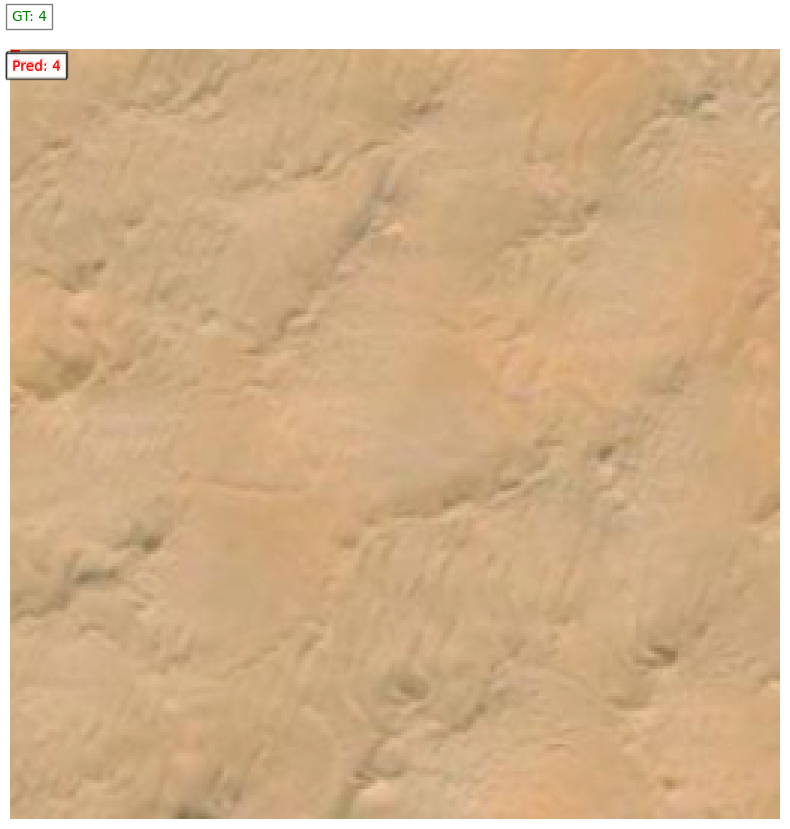

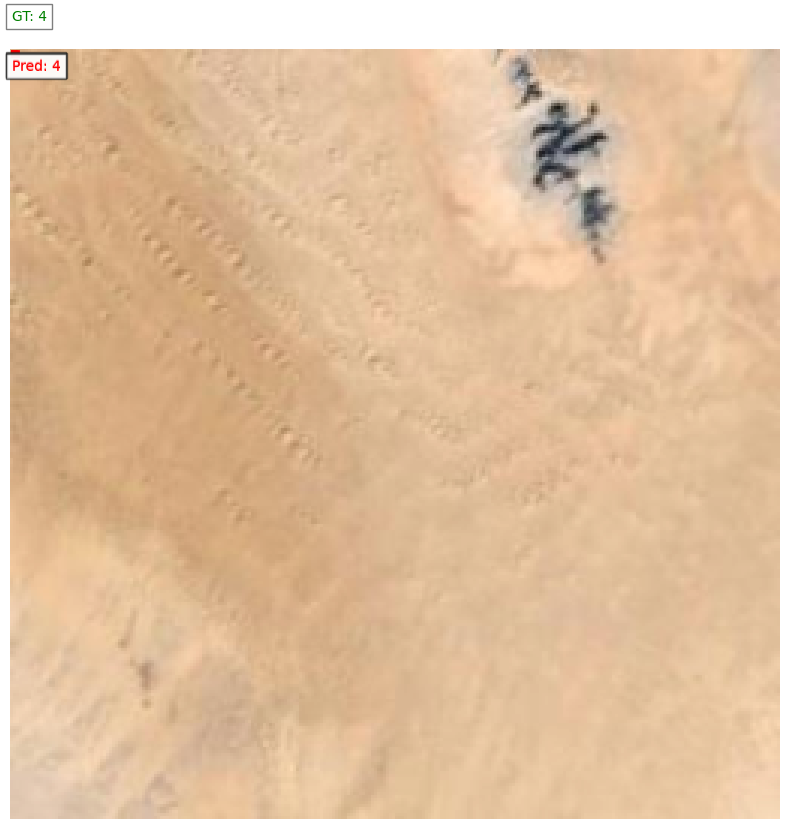

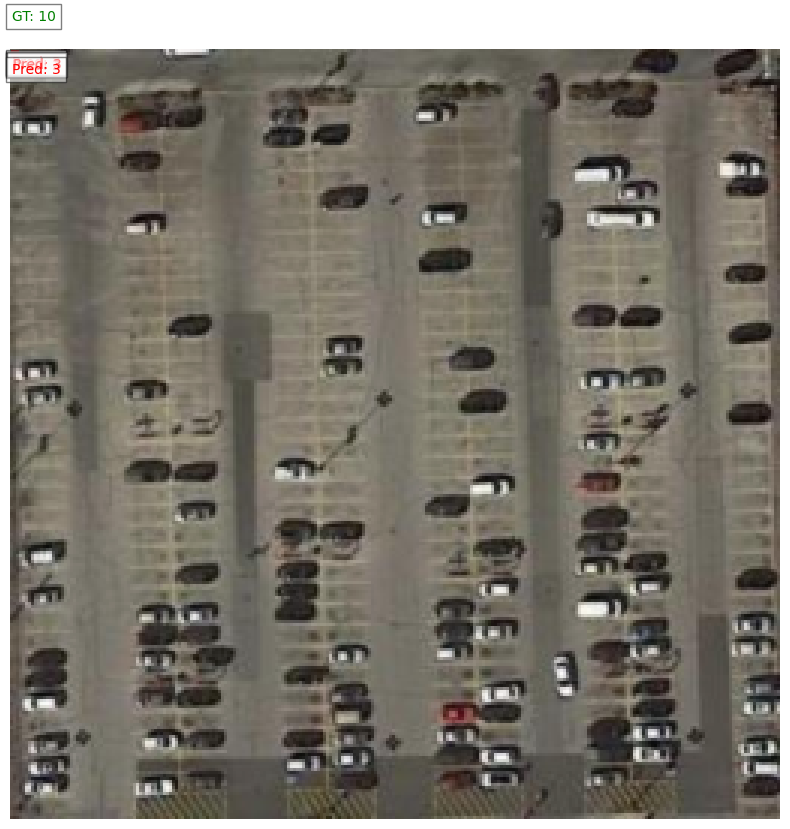

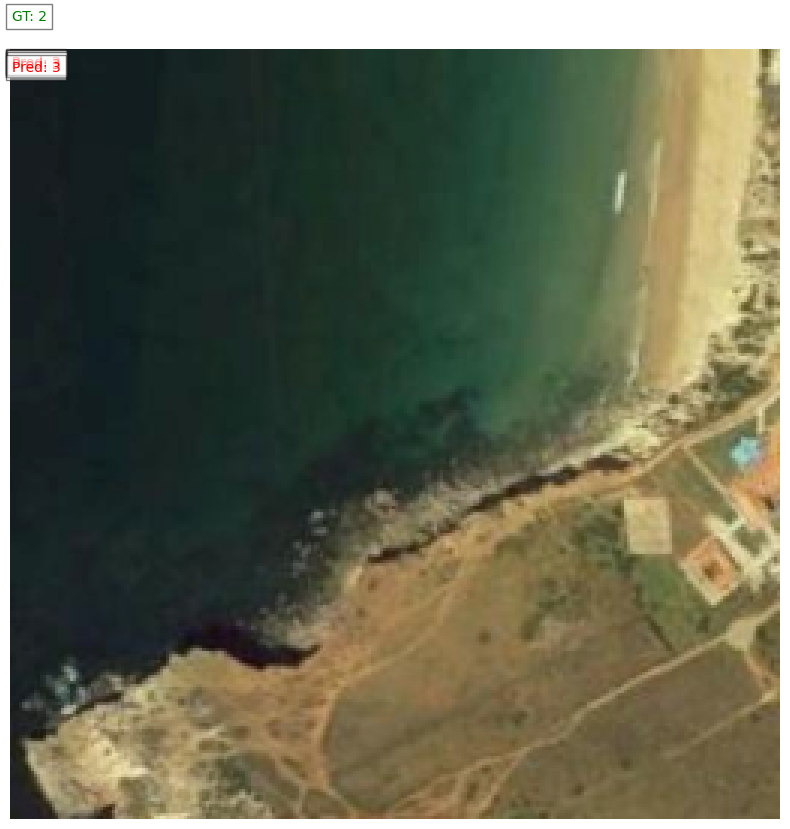

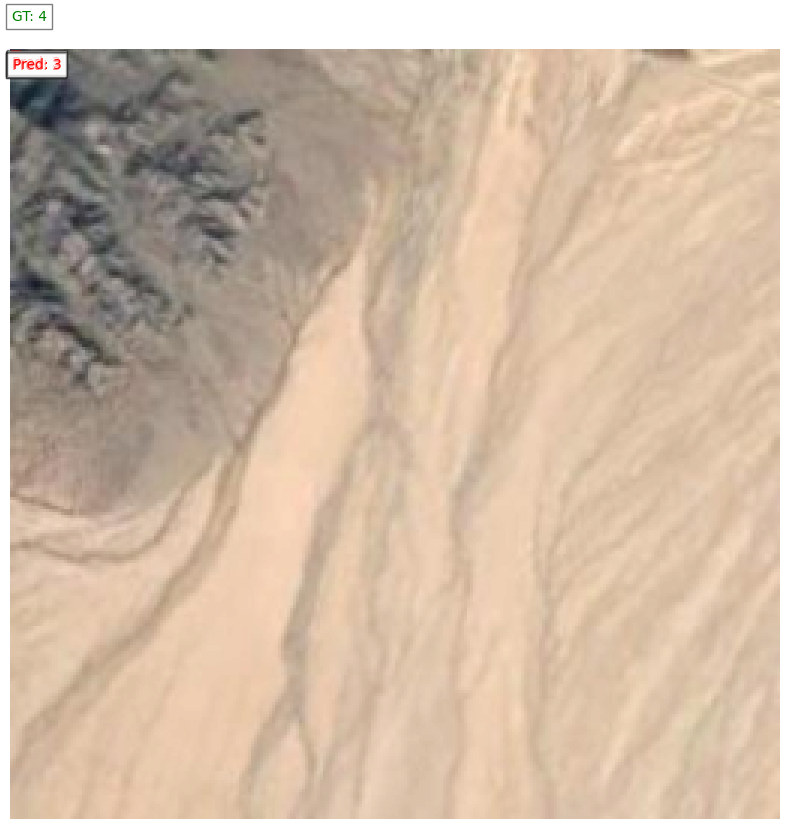

...

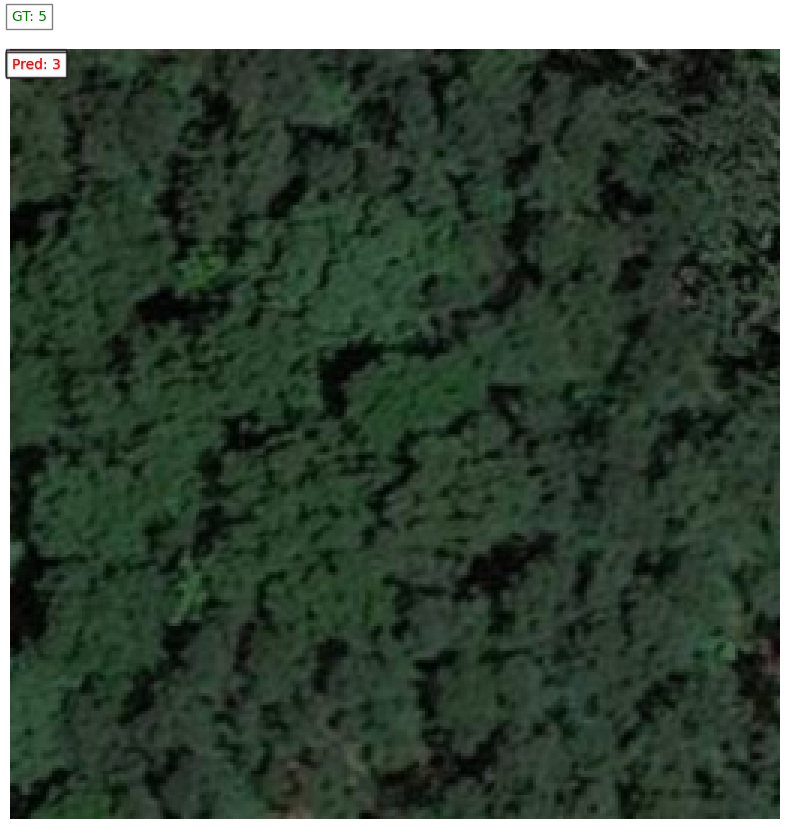

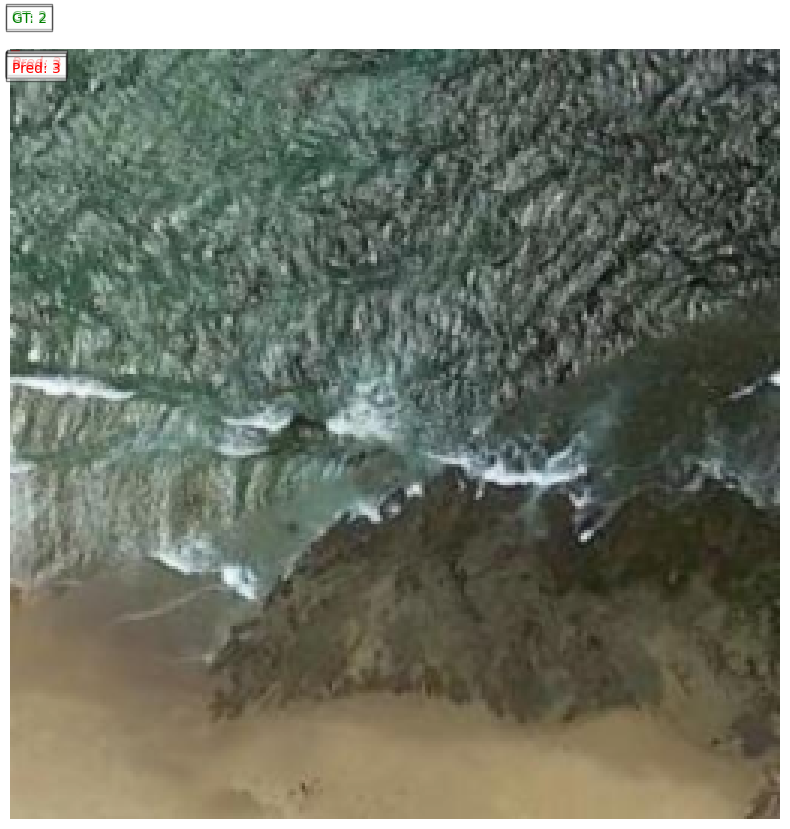

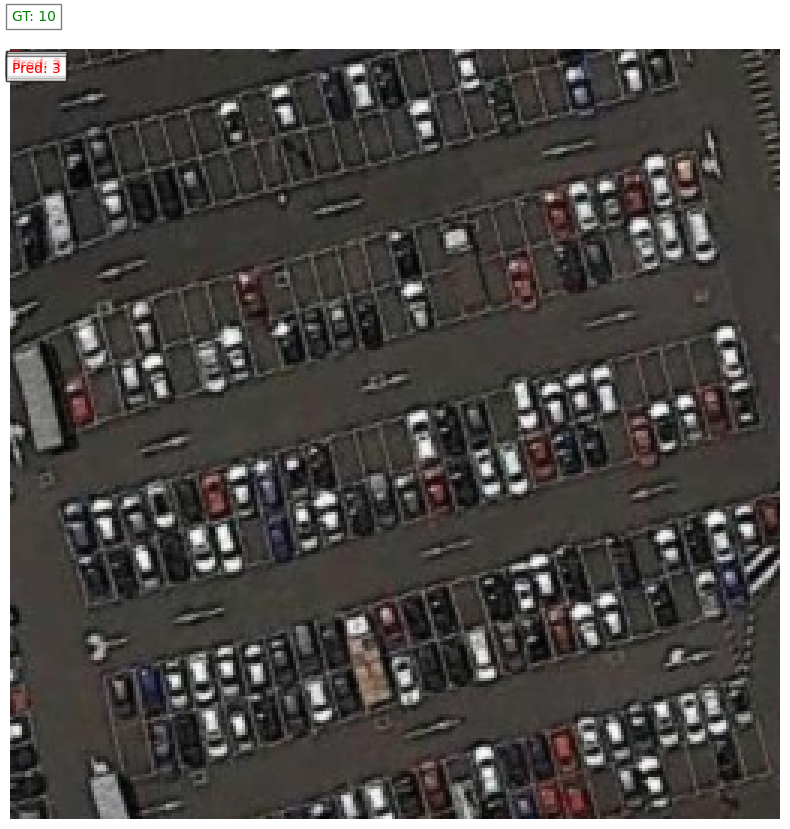

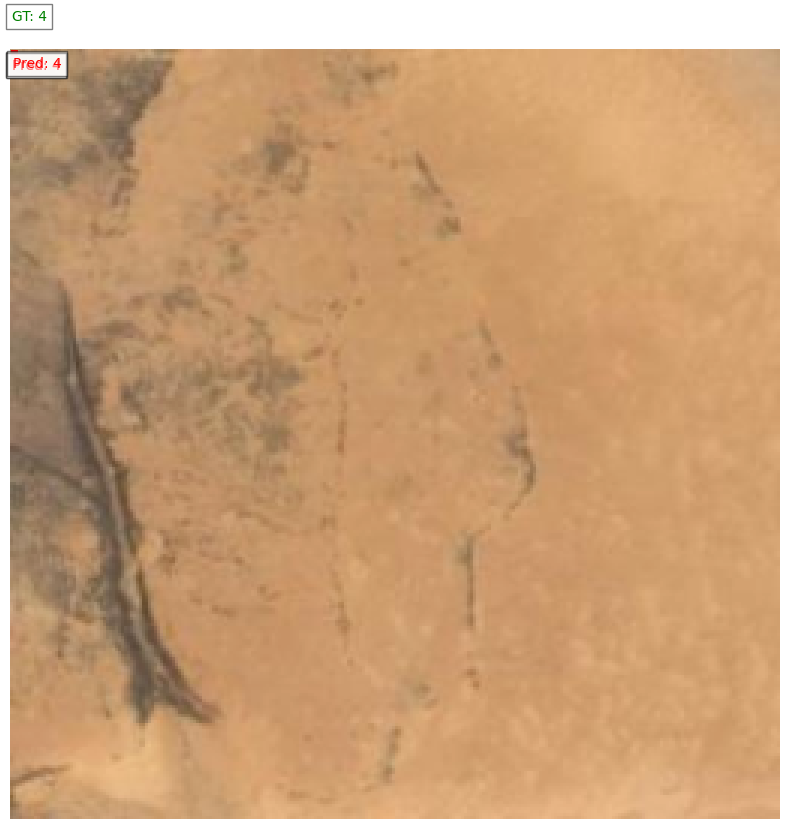

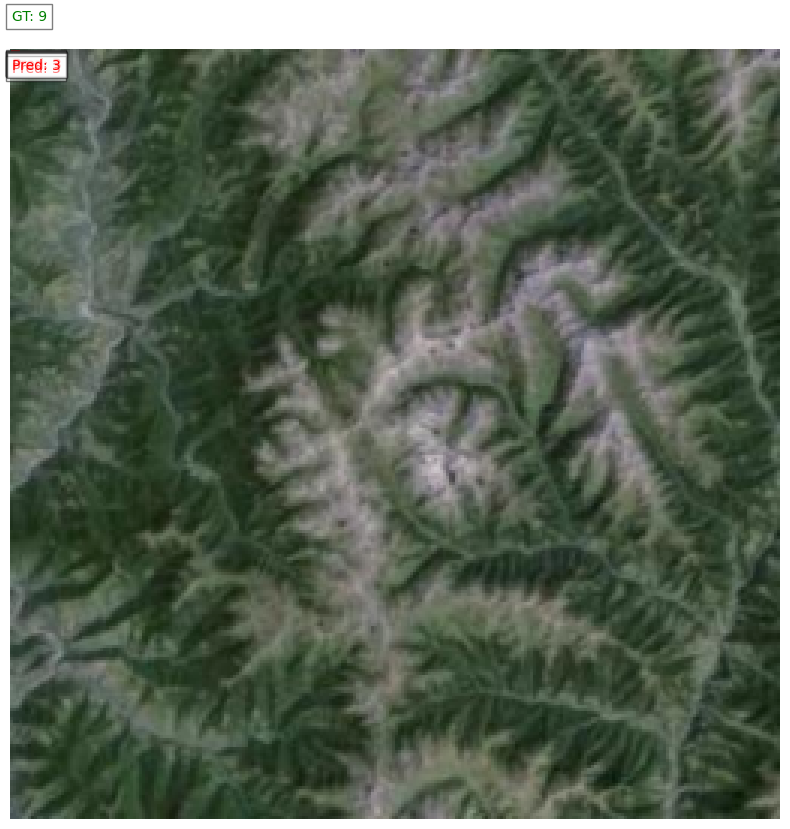

In [38]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
from torchvision.ops import nms

# Helper function to draw bounding boxes
def draw_boxes(image, gt_boxes, pred_boxes, gt_labels=None, pred_labels=None, score_threshold=0.5):
    fig, ax = plt.subplots(1, figsize=(10, 10))
    image = image.permute(1, 2, 0).cpu().numpy()  # Convert to HWC format for display
    image = image * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]  # Denormalize
    image = (image * 255).astype('uint8')  # Rescale to 0-255
    
    ax.imshow(image)
    
    # Draw ground truth boxes
    for i, box in enumerate(gt_boxes):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='green', facecolor='none')
        ax.add_patch(rect)
        if gt_labels is not None:
            ax.text(xmin, ymin - 10, f"GT: {gt_labels[i]}", color='green', fontsize=10, bbox=dict(facecolor='white', alpha=0.5))
    
    # Draw predicted boxes
    for i, box in enumerate(pred_boxes):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        if pred_labels is not None:
            ax.text(xmin, ymax + 5, f"Pred: {pred_labels[i]}", color='red', fontsize=10, bbox=dict(facecolor='white', alpha=0.5))

    plt.axis('off')
    plt.show()

# IoU function to compute intersection over union
def compute_iou(box1, box2):
    # box format: [xmin, ymin, xmax, ymax]
    x1, y1, x2, y2 = box1
    x3, y3, x4, y4 = box2
    
    # Calculate intersection area
    ix = max(0, min(x2, x4) - max(x1, x3))
    iy = max(0, min(y2, y4) - max(y1, y3))
    intersection_area = ix * iy
    
    # Calculate union area
    area1 = (x2 - x1) * (y2 - y1)
    area2 = (x4 - x3) * (y4 - y3)
    union_area = area1 + area2 - intersection_area
    
    return intersection_area / union_area if union_area > 0 else 0

# Visualize predictions
with torch.no_grad():
    for i in range(len(test_images)):
        image = test_images[i].unsqueeze(0).to(device)  # Add batch dimension
        target = {k: v.to(device) for k, v in test_targets[i].items()}

        prediction = model(image)[0]

        gt_boxes = target['boxes'].cpu().numpy()
        pred_boxes = prediction['boxes'].detach().cpu().numpy()
        pred_labels = prediction['labels'].detach().cpu().numpy()
        pred_scores = prediction['scores'].detach().cpu().numpy()

        # Apply Non-Maximum Suppression (NMS) to filter out redundant boxes
        keep = nms(torch.tensor(pred_boxes), torch.tensor(pred_scores), 0.5)  # IoU threshold for NMS
        pred_boxes = pred_boxes[keep]
        pred_labels = pred_labels[keep]

        # Show the image with ground truth and predicted boxes
        draw_boxes(test_images[i], gt_boxes, pred_boxes, target['labels'].cpu().numpy(), pred_labels)
